# **Google Analytics 360**
# New Customer Acquisition Lifetime Value Prediction
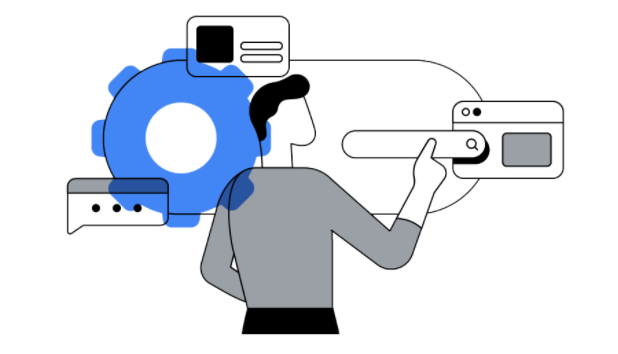

This notebook provides an example of training a customer "lifetime" value model for newly acquired e-commerce customers. It is meant to outline the minimum steps required to train this type of model and can be used as a starting point for your project. It is **not** meant to illustrate best practices or preferred approaches for this type of modeling.

The notebook references publicly available sample of Analytics 360 data, which is accessible through Google Cloud Platform's BigQuery data warehouse. The data was collected from the Google Merchandise Store, which sells Google promotional products like t-shirts, pens, phone accessories, mugs, etc.

For each newly acquired customer, we would like to make an estimate of the *future* revenue we can expect from this customer. We will make a prediction one week after the customer is acquired to estimate their revenue up to 90 days after their acquisition date. By combining this predicted revenue with the actual revenue generated from the customer's first purchase and any subsequent purchase during their first week, we can get a more hollistic view of the value of the acquisition. By providing this value (first transaction revenue + subsequent week 1 revenue + day 8-90 predicted revenue) to Google advertising platforms, Google can automatically optimize digital ads to help acquire higher value new customers.

Group : 8
Team : Hitika Hirani, Ishita Sengupta, 
Oyinkansola Omotola Honey Awosika, Pranjali Joshi, Shreyas Bhargava, Upasana Mohapatra

## Creating training, testing & holdout datasets

In [1]:
from google.colab import auth
auth.authenticate_user()
print('Authenticated')

Authenticated


In [2]:
# Query the Analytics 360 sample in BigQuery and store results as a Pandas dataframe
import pandas as pd
import numpy as np
import google.auth
from google.cloud import bigquery
from google.cloud import bigquery_storage

# Linking BigQuery Project -Id
project = 'project-501-8'

credentials, project_id = google.auth.default(
    scopes=["https://www.googleapis.com/auth/cloud-platform"]
)

bqclient = bigquery.Client(credentials=credentials, project=project,)
bqstorageclient = bigquery_storage.BigQueryReadClient(credentials=credentials)

# first_purchases selects data with acquisition date before 05/2017 (Data ends on 08/2017 and we want to get 90 days data from the acquisition date) and having revenue greater than 0 for USA.
sql = """
WITH first_purchases AS (
# Find the start time for the session when the customer made their first purchase
SELECT 
    fullVisitorId, # Consider this the customer ID
    MIN(PARSE_TIMESTAMP('%s', CAST(visitStartTime AS string))) firstPurchaseSessionTime 
FROM 
    `bigquery-public-data.google_analytics_sample.ga_sessions_*`
WHERE
    _TABLE_SUFFIX < '20170501' # The sample data ends in 08/2017 so we want to only look at acquisitions before 05/2017 to ensure they all have at least 90 days of subsequent data available
    AND totals.transactions > 0
    AND totals.transactionRevenue > 0
    AND geoNetwork.country = 'United States' 
GROUP BY
    fullVisitorId
),

# first_purchases_session gives session level data when customer made their first purchases. Important attributes are ChannelGrouping types, browser types and major metro/region from the sessions data. 
first_purchases_sessions AS (
SELECT 
    fp.fullVisitorId,
    ROUND(SUM(totals.transactionRevenue/1000000),2) AS revenue,
    MAX(visitNumber) AS visitNumber,
    SUM(totals.hits) AS hits,
    SUM(totals.pageviews) AS pageviews,
    COALESCE(SUM(totals.timeOnSite),0) AS timeOnSite,
    MAX(CASE WHEN channelGrouping = 'Referral' THEN 1 ELSE 0 END) AS referralChannelGrouping,
    MAX(CASE WHEN channelGrouping = 'Organic Search' THEN 1 ELSE 0 END) AS organicSearchChannelGrouping,
    MAX(CASE WHEN channelGrouping = 'Direct' THEN 1 ELSE 0 END) AS directChannelGrouping,  
    MAX(CASE WHEN channelGrouping = 'Paid Search' THEN 1 ELSE 0 END) AS paidSearchChannelGrouping,
    MAX(CASE WHEN channelGrouping = 'Display' THEN 1 ELSE 0 END) AS displayChannelGrouping,
    MAX(CASE WHEN channelGrouping = 'Affiliates' THEN 1 ELSE 0 END) AS affiliatesChannelGrouping,
    MAX(CASE WHEN device.browser = 'Chrome' THEN 1 ELSE 0 END) AS chromeBrowser,
    MAX(CASE WHEN device.browser = 'Safari' THEN 1 ELSE 0 END) AS safariBrowser,
    MAX(CASE WHEN device.operatingSystem = 'Macintosh' THEN 1 ELSE 0 END) AS macintoshOS,
    MAX(CASE WHEN device.operatingSystem = 'Windows' THEN 1 ELSE 0 END) AS windowsOS,
    MAX(CASE WHEN device.operatingSystem = 'Chrome OS' THEN 1 ELSE 0 END) AS chromeOS,
    MAX(CASE WHEN device.operatingSystem = 'Linux' THEN 1 ELSE 0 END) AS LinuxOS,
    MAX(CASE WHEN device.isMobile IS TRUE THEN 1 ELSE 0 END) AS mobileVisits, 
    MAX(CASE WHEN geoNetwork.metro = 'Los Angeles CA' THEN 1 ELSE 0 END) AS california,
    MAX(CASE WHEN geoNetwork.metro = 'San Francisco-Oakland-San Jose CA' THEN 1 ELSE 0 END) AS bayArea,
    MAX(CASE WHEN geoNetwork.metro = 'New York NY' THEN 1 ELSE 0 END) AS newYork,
    MAX(CASE WHEN geoNetwork.metro = 'Seattle-Tacoma WA' THEN 1 ELSE 0 END) AS seattle,
    MAX(CASE WHEN geoNetwork.metro = 'Chicago IL' THEN 1 ELSE 0 END) AS chicago,
    MAX(CASE WHEN geoNetwork.region = 'Texas' THEN 1 ELSE 0 END) AS texas
FROM 
    `bigquery-public-data.google_analytics_sample.ga_sessions_*` ga
JOIN
    first_purchases fp
ON
    ga.fullVisitorId = fp.fullVisitorId
    AND PARSE_TIMESTAMP('%s', CAST(ga.visitStartTime AS string)) = fp.firstPurchaseSessionTime # Only getting data from first purchase
WHERE
    _TABLE_SUFFIX < '20170501' 
    AND totals.transactions > 0
    AND totals.transactionRevenue > 0
    AND geoNetwork.country = 'United States'
GROUP BY
    fp.fullVisitorId
),

#first_purchases_hits fetches hit-level data from the session when the customer made their first purchase. 
#Important attributes are first purchase level- productQuantity, product categories, actions taken on the google store,time of purchase, product list, social network and content group. 
first_purchases_hits AS (

SELECT 
    fp.fullVisitorId,
    MAX(product.productPrice) AS productPrice,
    SUM(CASE WHEN hits.eCommerceAction.action_type = '6' THEN product.productQuantity ELSE 0 END) AS productQuantityPurchased, # Product quantity in the final transaction
    MAX(CASE WHEN product.v2ProductCategory = 'Apparel' AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS apparelPurchased, 
    MAX(CASE WHEN product.v2ProductCategory = 'Office' AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS officePurchased,
    MAX(CASE WHEN product.v2ProductCategory = 'Drinkware' AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS drinkwarePurchased,
    MAX(CASE WHEN product.v2ProductCategory = 'Lifestyle' AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS lifestylePurchased,
    MAX(CASE WHEN product.v2ProductCategory = 'Bags' AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS bagsPurchased,
    MAX(CASE WHEN product.v2ProductCategory = 'Electronics' AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS electronicsPurchased,
    MAX(CASE WHEN hits.eCommerceAction.action_type = '4' THEN 1 ELSE 0 END) AS removedItemFromCart, 
    MAX(CASE WHEN hits.eCommerceAction.action_type = '3' THEN 1 ELSE 0 END) AS AddeditemtoCart,
    MAX(CASE WHEN hits.eCommerceAction.action_type = '5' THEN 1 ELSE 0 END) AS CheckOut,
    MAX(CASE WHEN hits.eCommerceAction.option = 'Billing and Shipping' THEN 1 ELSE 0 END) AS billingandshippingoption,
    MAX(CASE WHEN hits.eCommerceAction.option = 'Payment' THEN 1 ELSE 0 END) AS paymentoption,
    MAX(CASE WHEN hits.eCommerceAction.option = 'Review' THEN 1 ELSE 0 END) AS reviewoption,
    MAX(CASE WHEN hits.hour BETWEEN 0 and 6 AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS midnightPurchase,
    MAX(CASE WHEN hits.hour BETWEEN 7 and 12 AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS morningPurchase,
    MAX(CASE WHEN hits.hour BETWEEN 13 and 15 AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS noonPurchase,
    MAX(CASE WHEN hits.hour BETWEEN 16 and 19 AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS eveningPurchase,
    MAX(CASE WHEN hits.hour BETWEEN 20 and 23 AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS nightPurchase,
    MAX(CASE WHEN hits.isEntrance IS TRUE THEN 1 ELSE 0 END) AS isEntrance,
    MAX(CASE WHEN hits.isExit IS TRUE THEN 1 ELSE 0 END) AS isExit,
    MAX(CASE WHEN product.productListName = 'Category' THEN 1 ELSE 0 END) AS categoryList,
    MAX(CASE WHEN product.productListName = 'Related Products' THEN 1 ELSE 0 END) AS relatedproductsList,
    MAX(CASE WHEN product.productListName = 'Search Results' THEN 1 ELSE 0 END) AS searchList,
    MAX(CASE WHEN hits.social.hasSocialSourceReferral = 'Yes' THEN 1 ELSE 0 END) AS hasSocialSource,
    MAX(CASE WHEN hits.social.socialNetwork = 'YouTube' THEN 1 ELSE 0 END) AS youtubeSocialNetwork,
    MAX(CASE WHEN hits.social.socialNetwork = 'Facebook' THEN 1 ELSE 0 END) AS facebookSocialNetwork,
    MAX(CASE WHEN hits.contentGroup.contentGroup1 = 'Google' THEN 1 ELSE 0 END) AS googleContentGroup,
    MAX(CASE WHEN hits.contentGroup.contentGroup1 = 'YouTube' THEN 1 ELSE 0 END) AS youTubeContentGroup,
    MAX(CASE WHEN hits.contentGroup.contentGroup1 = 'Android' THEN 1 ELSE 0 END) AS androidContentGroup
FROM 
    `bigquery-public-data.google_analytics_sample.ga_sessions_*` ga,
    UNNEST(hits) hits,
    UNNEST(hits.product) product

JOIN
    first_purchases fp
ON
    ga.fullVisitorId = fp.fullVisitorId
    AND PARSE_TIMESTAMP('%s', CAST(ga.visitStartTime AS string)) = fp.firstPurchaseSessionTime # Only getting data from first purchase
WHERE
    _TABLE_SUFFIX < '20170501' 
    AND totals.transactions > 0
    AND totals.transactionRevenue > 0
    AND geoNetwork.country = 'United States'
GROUP BY
    fp.fullVisitorId
),

 # before_purchases fetches data 7 days prior to the first purchase, looking into promotion attribute.
before_purchases AS (
# For each newly acquired customer, look for any promotion that occurred 7 days prior to purchase
SELECT
    fp.fullVisitorId,
    MAX(CASE WHEN hits.promotionActionInfo.promoIsClick IS TRUE THEN 1 ELSE 0 END) AS promoClick    
FROM 
   `bigquery-public-data.google_analytics_sample.ga_sessions_*` ga ,
    UNNEST(hits) hits
LEFT JOIN
     first_purchases fp
ON 
    fp.fullVisitorId = ga.fullVisitorId
    AND TIMESTAMP_DIFF(PARSE_TIMESTAMP('%s', CAST(ga.visitStartTime AS string)), fp.firstPurchaseSessionTime, DAY) BETWEEN -7 AND 0 # Consider purchases between -7 to 0 days before acquisition
WHERE 
    ga.totals.transactions > 0
    AND totals.transactionRevenue > 0
GROUP BY 
    fp.fullVisitorId
),
# first_week_sessions gets session level data that occured after the first purchase session but within 7 days of that session. 
#Important attributes are first week level - visits, transaction, revenue, timeon site and hits.
first_week_sessions AS (
SELECT 
    fp.fullVisitorId,
    COALESCE(SUM(ga.totals.visits),0) AS firstWeekVisits, # Visits from first week of acquisition, excluding acquisition session
    COALESCE(SUM(ga.totals.transactions),0) AS firstWeekTransactions, # Transactions from first week of acquisition, excluding acquisition session
    COALESCE(ROUND(SUM(ga.totals.transactionRevenue/1000000),2),0) AS firstWeekRevenue, # Revenue from first week of acquisition, excluding acquisition session
    COALESCE(SUM(ga.totals.timeOnSite)) AS firstWeekTimeOnSite,
    COALESCE(SUM(ga.totals.hits),0) AS firstWeekHits
FROM 
    first_purchases fp
LEFT JOIN
    `bigquery-public-data.google_analytics_sample.ga_sessions_*` ga
ON 
    fp.fullVisitorId = ga.fullVisitorId
    AND TIMESTAMP_DIFF(PARSE_TIMESTAMP('%s', CAST(ga.visitStartTime AS string)), fp.firstPurchaseSessionTime, HOUR) BETWEEN 1 AND 168 # Consider visits between 1 hour and 7 days after first purchase session
GROUP BY 
    fp.fullVisitorId
),

# future_purchases looks for any purchases that occurred in the next 8-90 days. 
#future_revenue is our target variable for model.

future_purchases AS (

SELECT
    fp.fullVisitorId,
    ROUND(SUM(ga.totals.transactionRevenue/1000000),2) AS futureRevenue 
FROM 
    first_purchases fp
LEFT JOIN
    `bigquery-public-data.google_analytics_sample.ga_sessions_*` ga
ON 
    fp.fullVisitorId = ga.fullVisitorId
    AND TIMESTAMP_DIFF(PARSE_TIMESTAMP('%s', CAST(ga.visitStartTime AS string)), fp.firstPurchaseSessionTime, DAY) BETWEEN 8 AND 90 # Consider purchases between 8-90 days after acquisition
WHERE 
    ga.totals.transactions > 0
    AND totals.transactionRevenue > 0
GROUP BY 
    fp.fullVisitorId
)
# Join the list of newly acquired customers to their acquisition session-level data, acquisition hit-level data, first week session-level data, Before purchase data and future day 8-90 revenue
SELECT
    first_purchases.*,
    first_purchases_sessions.* EXCEPT(fullVisitorId),
    first_purchases_hits.* EXCEPT(fullVisitorId),
    first_week_sessions.* EXCEPT(fullVisitorId),
    before_purchases.* EXCEPT(fullVisitorId),
    COALESCE(future_purchases.futureRevenue,0) AS futureRevenue
FROM 
    first_purchases
LEFT JOIN 
    first_purchases_sessions 
USING(fullVisitorId)
LEFT JOIN 
    first_purchases_hits 
USING(fullVisitorId)
LEFT JOIN 
    before_purchases 
USING(fullVisitorId)
LEFT JOIN 
    future_purchases 
USING(fullVisitorId)
LEFT JOIN
    first_week_sessions 
USING(fullVisitorId)
"""

# Store query results as Panada dataframe
df = pd.read_gbq(sql, project_id=project, dialect='standard', use_bqstorage_api=True)

/usr/local/lib/python3.7/dist-packages/google/cloud/bigquery_storage_v1beta1/reader.py:603: FutureWarning: Using .astype to convert from timezone-aware dtype to timezone-naive dtype is deprecated and will raise in a future version.  Use obj.tz_localize(None) or obj.tz_convert('UTC').tz_localize(None) instead
  df[column] = pandas.Series(df[column], dtype=dtypes[column])


In [3]:
#df.head()

In [4]:
# Create development and holdout datasets
# Dev data will be further split into training and testing data
# The holdout data will be used to get a final estimate of the model's performance
dev_data = df[df['firstPurchaseSessionTime'] < '2017-04-01 00:00:00 UTC']
holdout_data = df[df['firstPurchaseSessionTime'] >= '2017-04-01 00:00:00 UTC']

## Exploratory Data Analysis

In [5]:
!pip install pycaret  
from pycaret.regression import *

eda_data = dev_data.drop(['fullVisitorId', 'firstPurchaseSessionTime'], axis=1) # Exclude fullVisitorId and firstPurchaseSessionTime from EDA
eda_data = eda_data.reset_index(drop=True)

pc_eda = setup(data = eda_data, target = 'futureRevenue', session_id=123 , profile=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Based on the exploratory data analysis above, a few things are evident.
- There are outliers present with respect to both the dependent and independent variables. For simplicity, we will drop records containing these outliers.
- Unfortunately it doesn't look like there are any high correlations between the futureRevenue and other variables. We will be handling it by including depth and variables in our model.


In [6]:
#Handling missing values for FirstWeekTimeOnSite
eda_data['firstWeekTimeOnSite'] = eda_data['firstWeekTimeOnSite'].fillna(eda_data['firstWeekTimeOnSite'].median())
eda_data['CheckOut'] = eda_data['CheckOut'].fillna(eda_data['CheckOut'].median())
eda_data['affiliatesChannelGrouping'] = eda_data['affiliatesChannelGrouping'].fillna(eda_data['affiliatesChannelGrouping'].median())
# Drop records with outlier values and re-do EDA
eda_data_v2 = eda_data.drop(
                    eda_data[(eda_data['futureRevenue'] >= 10000.00) 
                    | (eda_data['revenue'] >= 10000.00)
                    | (eda_data['visitNumber'] >= 150) 
                    | (eda_data['productQuantityPurchased'] >= 1500)].index)

eda_data_v2 = eda_data_v2.reset_index(drop=True)

pc_eda_v2 = setup(data = eda_data_v2, target = 'futureRevenue', session_id=123 , profile=True)

IntProgress(value=0, description='Processing: ', max=3)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,06:41:43
Status,. . . . . . . . . . . . . . . . . .,Preprocessing Data


Text(value="Following data types have been inferred automatically, if they are correct press enter to continue…

,Data Type
revenue,Numeric
visitNumber,Numeric
hits,Numeric
pageviews,Numeric
timeOnSite,Numeric
...,...
firstWeekRevenue,Numeric
firstWeekTimeOnSite,Numeric
firstWeekHits,Numeric
promoClick,Categorical


KeyboardInterrupt: ignored

## Model training

In [7]:
# Importing packages for modeling approach, regression model and classification model
import xgboost as xgb
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, RandomForestRegressor
from sklearn.linear_model import LogisticRegression, LogisticRegression
from sklearn.naive_bayes import GaussianNB, GaussianNB
from sklearn import metrics
from sklearn.metrics import roc_auc_score, r2_score, precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score
from sklearn.metrics import mean_squared_error as mse
from sklearn.model_selection import train_test_split
from yellowbrick.regressor import prediction_error
from yellowbrick.regressor import ResidualsPlot

### Initial model

In [8]:
 # Drop the same rows dropped during EDA
dev_data = dev_data.drop(
                    dev_data[(dev_data['futureRevenue'] >= 10000.00) 
                    | (dev_data['revenue'] >= 10000.00)
                    | (dev_data['visitNumber'] >= 150) 
                    | (dev_data['productQuantityPurchased'] >= 1500)].index)

dev_data = dev_data.reset_index(drop=True)

# Setup the data for SK Learn
X = dev_data.drop(['fullVisitorId', 'firstPurchaseSessionTime','futureRevenue'], axis=1) # Feature matrix in pd.DataFrame format...fullVisitorId, session time, and future revenue aren't being used as predictor variables
y = pd.Series(dev_data.futureRevenue) # Target vector in pd.Series format

# Making train and test sets for both X and y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=123, shuffle=True)

# XGB Boost Regressor model with hyper parameter tuning.
model = xgb.XGBRegressor(max_depth=8, n_estimators=150,
                           reg_alpha=10, reg_lambda=0,
                           objective='reg:squarederror', booster='gbtree',
                           random_state=123, learning_rate=0.20)

#model = LinearRegression()
#model = DecisionTreeRegressor(max_depth=3)

# Fit the data(train the model)
model.fit(X_train, y_train)

# Calculate RMSE and R^2 for training data
train_y_pred = model.predict(X_train) # Predictions for training data
train_y_true = y_train # True values for training data

Training_MSE = mse(train_y_true, train_y_pred)
Training_RMSE = np.sqrt(Training_MSE)

Training_R_squared = r2_score(train_y_true, train_y_pred)

# Calculate RMSE and R^2 for testing data
test_y_pred = model.predict(X_test) # Predictions for testing data
test_y_true = y_test # True values for testing data

Testing_MSE = mse(test_y_true, test_y_pred)
Testing_RMSE = np.sqrt(Testing_MSE)

Testing_R_squared = r2_score(test_y_true, test_y_pred)

# Print evaluation metrics
print("\nTraining RMSE: ", np.round(Training_RMSE, 2))
print("Training R-Squared: ", np.round(Training_R_squared, 2))

print("\nTesting RMSE: ", np.round(Testing_RMSE, 2))
print("Testing R-Squared: ", np.round(Testing_R_squared, 2))

# Visualize the Prediction Error Plot
print("\nPrediction Error Plot")
viz = prediction_error(model, X_train, y_train, X_test, y_test)
viz.show() # Sometimes visualization fails after using PyCaret EDA... Have to restart runtime and skip EDA


Training RMSE:  2.41
Training R-Squared:  1.0

Testing RMSE:  173.33
Testing R-Squared:  0.09

Prediction Error Plot


This is not the best model. The R-squared is very low. It is also clear that most predictions are very close to 0.

Since there are so many 0 values for futureRevenue, we split this model into two parts. The first part is a regression model trained on only users with non-zero futureRevenue. The second part is a classification model trained on all users predicting the probability that they will make at least one future purchase. Our final prediction can be one of three options:
 - If our regression model is good but our classification model is bad, the prediction will be [Regression Model Prediction] * [Average Repeat Purchase Rate]
 - If our regression model is bad but our classification model is good, the prediction will be [Average futureValue] * [Classification Model Prediction]
 - If our regression model is good and our classification model is good, the prediction will be [Regression Model Prediction] * [Classification Model Prediction]



### Regression model (repeat purchasers only)

In [ ]:

# Drop the same rows dropped during EDA

# Also drop any rows where futureRevenue = 0
reg_data = dev_data.drop(
                    dev_data[(dev_data['futureRevenue'] >= 10000.00) 
                    | (dev_data['revenue'] >= 10000.00)
                    | (dev_data['visitNumber'] >= 100) 
                    | (dev_data['productQuantityPurchased'] >= 1000)
                    | (dev_data['futureRevenue'] == 0)].index)

reg_data = reg_data.reset_index(drop=True)

# Find correlation between futureRevenue and other variables to select initial feature set
reg_data[reg_data.columns[1:]].corr()['futureRevenue'][:-1]

revenue                0.362663
visitNumber            0.045339
hits                   0.187032
pageviews              0.200819
timeOnSite             0.168338
                         ...   
firstWeekRevenue       0.194428
firstWeekTimeOnSite    0.224127
firstWeekHits          0.151505
promoClick             0.030857
futureRevenue          1.000000
Name: futureRevenue, Length: 61, dtype: float64

In [ ]:
# Setup the data for SK Learn
# While using Random Forest model, remove CheckOut, affiliatesChannelGrouping, youtubeSocialNetwork
# Feature matrix will include variables with largest correlations to futureRevenue
X = reg_data[['revenue', 'visitNumber', 'hits', 'pageviews', 'timeOnSite', 'referralChannelGrouping', 'organicSearchChannelGrouping', 'directChannelGrouping', 'paidSearchChannelGrouping', 'displayChannelGrouping', 'affiliatesChannelGrouping', 'chromeBrowser', 'safariBrowser', 'macintoshOS', 'windowsOS', 'chromeOS', 'LinuxOS', 'mobileVisits', 'california', 'bayArea', 'newYork', 'seattle', 'chicago', 'texas', 'productPrice', 'productQuantityPurchased', 'apparelPurchased', 'officePurchased', 'drinkwarePurchased', 'lifestylePurchased', 'bagsPurchased', 'electronicsPurchased', 'removedItemFromCart', 'AddeditemtoCart', 'CheckOut', 'billingandshippingoption', 'paymentoption', 'reviewoption', 'midnightPurchase', 'morningPurchase', 'noonPurchase', 'eveningPurchase', 'nightPurchase', 'isEntrance', 'isExit', 'categoryList', 'relatedproductsList', 'searchList', 'hasSocialSource', 'youtubeSocialNetwork', 'facebookSocialNetwork', 'googleContentGroup', 'youTubeContentGroup', 'androidContentGroup', 'firstWeekVisits', 'firstWeekTransactions', 'firstWeekRevenue', 'firstWeekTimeOnSite', 'firstWeekHits', 'promoClick']]
y = pd.Series(reg_data.futureRevenue) # Target vector in pd.Series format



# Making train and test sets for both X and y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=123, shuffle=True)

# Instantiate XGBoost object with hyperparameters...No hyperparameter tuning is included in this example but would be beneficial
reg_model = xgb.XGBRegressor(max_depth=5, n_estimators=100,
                           reg_alpha=100, reg_lambda=10,
                           objectvie='reg:squarederror', booster='gbtree',
                           random_state=123, learning_rate=0.02)

#reg_model = LinearRegression()
#reg_model = DecisionTreeRegressor(max_depth=4)
#reg_model = RandomForestRegressor(n_estimators=100, random_state=42)


# Fit the data(train the model)
reg_model.fit(X_train, y_train)

# Get RMSE and R^2 for training data
train_y_pred = reg_model.predict(X_train) # Predictions for training data
train_y_true = y_train # True values for training data

Training_MSE = mse(train_y_true, train_y_pred)
Training_RMSE = np.sqrt(Training_MSE)

Training_R_squared = r2_score(train_y_true, train_y_pred)

# Get RMSE and R^2 for testing data
test_y_pred = reg_model.predict(X_test) # Predictions for testing data
test_y_true = y_test # True values for testing data

Testing_MSE = mse(test_y_true, test_y_pred)
Testing_RMSE = np.sqrt(Testing_MSE)

Testing_R_squared = r2_score(test_y_true, test_y_pred)

# Print evaluation metrics
print("\nTraining RMSE: ", np.round(Training_RMSE, 2))
print("Training R-Squared: ", np.round(Training_R_squared, 2))

print("\nTesting RMSE: ", np.round(Testing_RMSE, 2))
print("Testing R-Squared: ", np.round(Testing_R_squared, 2))

# Visualize the Prediction Error Plot
print("\nPrediction Error Plot")
viz = prediction_error(reg_model, X_train, y_train, X_test, y_test)
viz.show()

[16:01:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training RMSE:  376.43
Training R-Squared:  0.61

Testing RMSE:  370.74
Testing R-Squared:  0.05

Prediction Error Plot


We're able to make a significantly better model predicting futureValue for repeat purchasers only. R-Squared of 0.5 is better than the initial model.

### Classification model (likelihood to purchase again)

In [ ]:
# Drop the same rows dropped during EDA
# We included both repeat purchasers and single purchasers here since we're trying to predict repeat purchase
cla_data = dev_data.drop(
                    dev_data[(dev_data['futureRevenue'] >= 10000.00) 
                    | (dev_data['revenue'] >= 10000.00)
                    | (dev_data['visitNumber'] >= 100) 
                    | (dev_data['productQuantityPurchased'] >= 1000)].index)

# repeatPurchaser is model's target
cla_data['repeatPurchaser'] = np.where(cla_data['futureRevenue'] > 0, 1, 0)

dev_data = dev_data.reset_index(drop=True)

#calculating correlation
cla_data[cla_data.columns[1:]].corr()['repeatPurchaser'][:-1]

revenue                0.120940
visitNumber            0.088569
hits                   0.069451
pageviews              0.063192
timeOnSite             0.053665
                         ...   
firstWeekRevenue       0.102284
firstWeekTimeOnSite    0.059109
firstWeekHits          0.102216
promoClick            -0.025594
futureRevenue          0.473001
Name: repeatPurchaser, Length: 61, dtype: float64

In [ ]:
# Setup the data for SK Learn

# Feature matrix will include variables with largest correlations to repeatVisitor (excluding futureRevenue)
X = cla_data[['revenue', 'visitNumber','productQuantityPurchased','firstWeekRevenue', 'firstWeekHits']]
y = pd.Series(cla_data.repeatPurchaser) # Target vector in pd.Series format



# Making train and test sets for both X and y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=123, shuffle=True)

# XGB Boost with hyperparameter tuning.
#cla_model = xgb.XGBClassifier(max_depth=6, n_estimators=150,
                           #reg_alpha=0.5, reg_lambda=0,
                           #objective="binary:logistic", booster='gbtree',
                           #random_state=123, learning_rate=0.2)
#cla_model = LogisticRegression()
#cla_model = DecisionTreeClassifier()
cla_model = GaussianNB()

# Fit the data(train the model)
cla_model.fit(X_train, y_train)

# Calculate evaluation metrics for classification model
train_y_pred = cla_model.predict(X_train) # Predictions for training data
train_y_true = y_train # True values for training data

test_y_pred = cla_model.predict(X_test) # Predictions for testing data
test_y_true = y_test # True values for testing data


print('\n clasification report:\n', classification_report(test_y_true, test_y_pred))
print('\n confussion matrix:\n',confusion_matrix(test_y_true, test_y_pred))
print('\n ROC AUC: \n',roc_auc_score(test_y_true, test_y_pred))


 clasification report:
               precision    recall  f1-score   support

           0       0.93      0.97      0.95      1132
           1       0.24      0.10      0.14        96

    accuracy                           0.90      1228
   macro avg       0.58      0.54      0.55      1228
weighted avg       0.87      0.90      0.89      1228


 confussion matrix:
 [[1100   32]
 [  86   10]]

 ROC AUC: 
 0.5379490577149588


We were able to improve ROC, but it is still not a strong predictor.

## Holdout predictions

As a final step we are comparing different options for making a prediction to a "naive estimate." The three options I will consider for making a prediction are:
- Naive estimate, which assumes each customer's 8-90 day future revenue will be equal to the average future revenue observed in the development dataset.
- Initial model's predictions. This was the first model with the low R-squared.
- Regression only model, which will take the predictions from the regression model trained on repeat purchasers multiplied by the average repeat purchase rate observered in the development dataset. 



In [ ]:
# Calculate average repeat purchase rate from development dataset
dev_data['repeatPurchaser'] = np.where(dev_data['futureRevenue'] > 0, 1, 0)
AvgRepeat = np.mean(dev_data['repeatPurchaser'])

# Calculate average future revenue observed in the development dataset
AvgCLV = np.mean(dev_data['futureRevenue']) 

# Create naive estimate for all customers, which is equal to average future revenue from development dataset
holdout_data['NaiveEstimate'] = AvgCLV 

# Set up holdout data for initial model
X_holdout = holdout_data.drop(['fullVisitorId', 'firstPurchaseSessionTime','futureRevenue','NaiveEstimate'], axis=1) 
y_holdout = pd.Series(holdout_data.futureRevenue)

holdout_y_pred = model.predict(X_holdout) # Initial model predictions for holdout data
holdout_y_true = y_holdout # True values for holdout data

# Set up data for regression only model
reg_X_holdout = holdout_data[['revenue', 'visitNumber', 'hits', 'pageviews', 'timeOnSite', 'referralChannelGrouping', 'organicSearchChannelGrouping', 'directChannelGrouping', 'paidSearchChannelGrouping', 'displayChannelGrouping', 'affiliatesChannelGrouping', 'chromeBrowser', 'safariBrowser', 'macintoshOS', 'windowsOS', 'chromeOS', 'LinuxOS', 'mobileVisits', 'california', 'bayArea', 'newYork', 'seattle', 'chicago', 'texas', 'productPrice', 'productQuantityPurchased', 'apparelPurchased', 'officePurchased', 'drinkwarePurchased', 'lifestylePurchased', 'bagsPurchased', 'electronicsPurchased', 'removedItemFromCart', 'AddeditemtoCart', 'CheckOut', 'billingandshippingoption', 'paymentoption', 'reviewoption', 'midnightPurchase', 'morningPurchase', 'noonPurchase', 'eveningPurchase', 'nightPurchase', 'isEntrance', 'isExit', 'categoryList', 'relatedproductsList', 'searchList', 'hasSocialSource', 'youtubeSocialNetwork', 'facebookSocialNetwork', 'googleContentGroup', 'youTubeContentGroup', 'androidContentGroup', 'firstWeekVisits', 'firstWeekTransactions', 'firstWeekRevenue', 'firstWeekTimeOnSite', 'firstWeekHits', 'promoClick']]

reg_holdout_y_pred = reg_model.predict(reg_X_holdout) * AvgRepeat # Regression only predictions for holdout data


# Get RMSE and MAE error based on naive estimate
Naive_MAE = np.mean(np.absolute(pd.Series(holdout_data.NaiveEstimate) - holdout_y_true))
Naive_MSE = mse(pd.Series(holdout_data.NaiveEstimate), holdout_y_true)
Naive_RMSE = np.sqrt(Naive_MSE)
Naive_Avg_Error = np.mean(pd.Series(holdout_data.NaiveEstimate) - holdout_y_true)

# Get RMSE, MAE, and average error based on initial model predictions
Initial_Model_MAE = np.mean(np.absolute(holdout_y_true - holdout_y_pred))
Initial_Model_MSE = mse(holdout_y_true, holdout_y_pred)
Initial_Model_RMSE = np.sqrt(Initial_Model_MSE)
Initial_Model_Avg_Error = np.mean(holdout_y_true - holdout_y_pred)

# Get RMSE and MAE error based on regression only model
Reg_Model_MAE = np.mean(np.absolute(holdout_y_true - reg_holdout_y_pred))
Reg_Model_MSE = mse(holdout_y_true, reg_holdout_y_pred)
Reg_Model_RMSE = np.sqrt(Reg_Model_MSE)
Reg_Model_Avg_Error = np.mean(reg_holdout_y_pred - holdout_y_true)

print("\nNaive MAE: ", np.round(Naive_MAE, 2))
print("Naive RMSE: ", np.round(Naive_RMSE, 2))
print("Naive Avg Error: ", np.round(Naive_Avg_Error, 2))

print("\nInitial Model MAE: ", np.round(Initial_Model_MAE, 2))
print("Initial Model RMSE: ", np.round(Initial_Model_RMSE, 2))
print("Initial Model Avg Error: ", np.round(Initial_Model_Avg_Error, 2))

print("\nRegression Only Model MAE: ", np.round(Reg_Model_MAE, 2))
print("Regression Only Model RMSE: ", np.round(Reg_Model_RMSE, 2))
print("Regression Only Model Avg Error: ", np.round(Reg_Model_Avg_Error, 2))



ValueError: ignored

The regression only model trained on repeat purchasers performed the best out of the options available. It lowered the MAE significantly compared to the naive estimate. It also had a lower prediction bias (measured by average prediction error) compared to the naive estimate. The naive estimate would tend to over-predict for the holdout dataset more than the regression only model.

Note: Random Forest Model in the regression has better Regression only Avg Error. 